In [1]:
import os
import pandas as pd
import numpy as np
import math
import re
import matplotlib.pyplot as plt

import graph_process

# Step 1. Data pre-processing and baseline content-based recommender system

* The dataset download URL is: ,  and should be saved into the './data/.csv' file.

In [2]:
df_links = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/links.csv'
df_movies = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/movies.csv'
#df_ratings = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ratings.csv'
df_tags = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/tags.csv'



# load original sub-dataset
df_links = graph_process.data_load(df_links)
df_movies = graph_process.data_load(df_movies)
#df_ratings = graph_process.data_load(df_ratings)
df_tags = graph_process.data_load(df_tags)

In [3]:
df_links.head(1)    # can be ignored

,movieId,imdbId,tmdbId
0,1,114709,862.0


In [111]:
df_tags.head(1)   # can be ignored

,userId,movieId,tag,timestamp
0,2,60756,funny,1445714994


In [112]:
df_movies.head(2)

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy


In [113]:
df_ratings.head(2)

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247


In [184]:
df_ratings_useful = df_ratings[df_ratings.rating>3]

user_set = df_ratings_useful.userId.unique()
movie_set = df_movies.movieId.unique()

In [3]:
genres = ["Action", "Adventure", "Animation", "Children", "Comedy", "Crime", "Documentary", "Drama", "Fantasy", "Film-Noir", "Horror", "Musical", "Mystery", "Romance", "Sci-Fi", "Thriller", "War", "Western", "IMAX"]
for i in genres: df_movies[i] = None

In [4]:
df_movies.head(2)

,movieId,title,genres,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,...,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,IMAX
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,2,Jumanji (1995),Adventure|Children|Fantasy,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [5]:
for i in range(len(df_movies)):
    genres = df_movies.loc[i, 'genres'].split('|')
    for category in genres:
        df_movies.loc[i, category] = 1

In [6]:
df_movies = df_movies.fillna(0)

In [7]:
df_movies.head(2)

,movieId,title,genres,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,...,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,IMAX,(no genres listed)
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,0,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0.0
1,2,Jumanji (1995),Adventure|Children|Fantasy,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.0


In [11]:
all_genres = list(df_movies.columns[3:])

### Following movie_table is the final movie recommendation look up table we want.

In [296]:
movie_table = dict()
for genres in all_genres:
    movie_table[genres] = dict()
    for i in list(df_movies[df_movies[genres]==1].movieId):
        movie_table[genres][str(i)] = len(df_ratings_useful[df_ratings_useful.movieId==i])
    movie_table[genres] = dict(sorted(movie_table[genres].items(), key=lambda x: x[1], reverse=True))

In [5]:
# movie_table['Action']

### Now we need to build the user_genres look up table

In [298]:
user_table  = {}

for user in user_set:
    movie_rated_by_user = list(df_ratings_useful[df_ratings_useful.userId==user].movieId)   # all movies rated by each user
    user_table[str(user)] = {}
    user_genres = []

    for movie in movie_rated_by_user:
        df = df_movies[df_movies.movieId==movie]
        for col in list(df_movies.columns)[3:]:
            if df[col].all()==1:
                user_genres.append(col)                 # all genres (including repeat genres in user_genres list)

    for i in user_genres:
        if i not in user_table[str(user)].keys():
            user_table[str(user)][i] = 1
        else: 
            user_table[str(user)][i] += 1

    user_table[str(user)] = dict(sorted(user_table[str(user)].items(), key=lambda x: x[1], reverse=True))

In [299]:
print(len(user_table))
user_table['1']

609


{'Action': 76,
 'Adventure': 74,
 'Comedy': 70,
 'Drama': 64,
 'Thriller': 43,
 'Fantasy': 41,
 'Crime': 39,
 'Children': 37,
 'Sci-Fi': 32,
 'Animation': 27,
 'Romance': 24,
 'War': 20,
 'Musical': 20,
 'Mystery': 13,
 'Horror': 9,
 'Western': 6,
 'Film-Noir': 1}

In [300]:
import numpy as np

# Save
np.save('./data/user_table.npy', user_table) 
np.save('./data/movie_table.npy', movie_table) 

In [251]:
# Load
'''
movie = np.load('./data/movie_table.npy', allow_pickle = True).item()
user = np.load('./data/user_table.npy', allow_pickle = True).item()
'''

### Then we can do recommendation for evaluation

In [316]:
def recommendation(userId, user_table, movie_table):
    res = []
    user_genres = list(user_table[userId].keys())[:5]       # take top 7 genres for each user
    
    for genres in user_genres:
        res.extend(list(movie_table[genres].keys())[:2])        # take top 2 movies for each genres

    return res

In [317]:
userId = '1'

res = recommendation(userId, user_table, movie_table)

In [318]:
res

['2571', '260', '260', '1198', '356', '296', '318', '356', '296', '2571']

In [329]:
for i in res:
    print('Recommend movies are: ', df_movies[df_movies.movieId==int(i)]['title'].unique())

Recommend movies are:  ['Matrix, The (1999)']
Recommend movies are:  ['Star Wars: Episode IV - A New Hope (1977)']
Recommend movies are:  ['Star Wars: Episode IV - A New Hope (1977)']
Recommend movies are:  ['Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981)']
Recommend movies are:  ['Forrest Gump (1994)']
Recommend movies are:  ['Pulp Fiction (1994)']
Recommend movies are:  ['Shawshank Redemption, The (1994)']
Recommend movies are:  ['Forrest Gump (1994)']
Recommend movies are:  ['Pulp Fiction (1994)']
Recommend movies are:  ['Matrix, The (1999)']


### ------------------------------- Finished here!


# Step 2. Graph construction.

* We need to construct graph network based on processed data and to do network visualization

In [507]:
import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt
import collections

df_links = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/links.csv'
df_movies = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/movies.csv'
df_ratings = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ratings.csv'
df_tags = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/tags.csv'

# load original sub-dataset
df_links = graph_process.data_load(df_links)
df_movies = graph_process.data_load(df_movies)
df_ratings = graph_process.data_load(df_ratings)
df_tags = graph_process.data_load(df_tags)

In [508]:
# new movie ID
movie_id = df_ratings['movieId'].unique()
movie_set = []
for i, movie in enumerate(movie_id):
    movie_set.append([movie, 'm'+str(i)])

df_movie = pd.DataFrame(movie_set, columns=['movieId', 'movieId_new'])

df_ratings = pd.merge(left=df_ratings, right=df_movie, on='movieId')

# new user ID
df_ratings['userId_new'] = df_ratings['userId'].astype('int') - 1
df_ratings['userId_new'] = df_ratings['userId_new'].astype('str')

df_ratings['userId_new'] = 'u' + df_ratings['userId_new']

df_ratings['movieId_new'] = df_ratings['movieId_new'].astype('str')

In [509]:
G = nx.from_pandas_edgelist(df_ratings, "movieId_new", "userId_new", edge_attr=True, create_using=nx.Graph())

len(G)

10334

In [124]:
node_list = list(df_filter.customer_id.unique()) + list(df_filter.movie_id.unique())
print(len(node_list))

edge_list = [(df_filter.loc[i, 'customer_id'], df_filter.loc[i, 'movie_id']) for i in range(len(df_filter))]
print(len(edge_list))

27
110


In [137]:
# now we start to construct the graph
G = nx.Graph()

# add nodes
G.add_nodes_from(node_list)

# add edges
G.add_edges_from(edge_list)


B = nx.Graph()

# Add nodes with the node attribute "bipartite"
B.add_nodes_from(list(df_filter.customer_id.unique()), bipartite=0)

B.add_nodes_from(list(df_filter.movie_id.unique()), bipartite=1)

# Add edges only between nodes of opposite node sets
B.add_edges_from(edge_list)

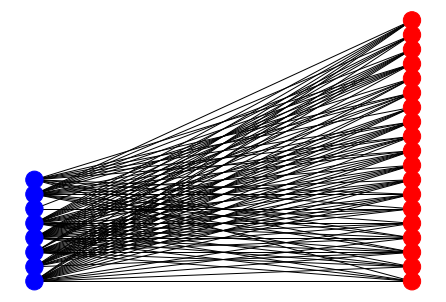

In [147]:
# Separate by group
l, r = nx.bipartite.sets(B)
pos = {}

# Update position for node from each group
pos.update((node, (1, index)) for index, node in enumerate(l))
pos.update((node, (2, index)) for index, node in enumerate(r))

color = bipartite.color(B)

color_dict = {0:'b',1:'r'}

color_list = [color_dict[i[1]] for i in B.nodes.data('bipartite')]

nx.draw(B, pos=pos, with_labels=False, node_color = color_list)
plt.show()

In [510]:
print(G.number_of_nodes())
print(G.number_of_edges())

10334
100836


In [519]:
#G.nodes

In [514]:
print(list(G.adj['m9717']))  # or list(G.neighbors(1))

print(G.degree['m9717'])  # the number of edges incident to 1

['u609']
1


In [515]:
nx.connected_components(G)

<generator object connected_components at 0x1a6de54b88>

In [132]:
# degree of each node
#sorted(d for n, d in G.degree())

In [517]:
# nx.clustering(G)

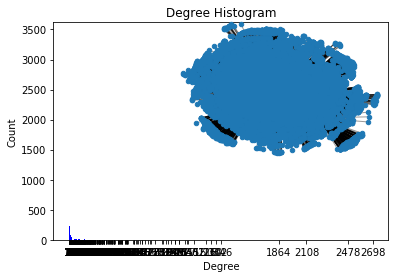

In [518]:
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)  # degree sequence
# print "Degree sequence", degree_sequence
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

fig, ax = plt.subplots()
plt.bar(deg, cnt, width=0.80, color='b')

plt.title("Degree Histogram")
plt.ylabel("Count")
plt.xlabel("Degree")
ax.set_xticks([d + 0.4 for d in deg])
ax.set_xticklabels(deg)

# draw graph in inset
plt.axes([0.4, 0.4, 0.5, 0.5])
Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
pos = nx.spring_layout(G)
plt.axis('off')
nx.draw_networkx_nodes(G, pos, node_size=20)
nx.draw_networkx_edges(G, pos, alpha=0.4)

plt.show()

# Step 3. Graph analysis and graph related features

* Edge weight distribution.
* Degree distribution.
* Cumulative degree distribution.
* Distance distribution.
* Clustering coefficients.
* Growth.
* Preferential attachment
* Random walk.


In [523]:
df_all = pd.merge(left=df_ratings, right=df_movies, on='movieId')

In [526]:
df_all.head(1) 

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres
0,1,1,4.0,964982703,m0,u0,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy


In [532]:
# add degree of each node as feature
movie_node = df_ratings['movieId_new'].unique()
movie_node_degree = []
for i, movie in enumerate(movie_node):
    movie_node_degree.append([movie, G.degree[movie]])

user_node = df_ratings['userId_new'].unique()
user_node_degree = []
for i, user in enumerate(user_node):
    user_node_degree.append([user, G.degree[user]])


df_movie_degree = pd.DataFrame(movie_node_degree, columns=['movieId_new', 'movie_node_degree'])
df_user_degree = pd.DataFrame(user_node_degree, columns=['userId_new', 'user_node_degree'])

df_all = pd.merge(left=df_all, right=df_movie_degree, on='movieId_new')
df_all = pd.merge(left=df_all, right=df_user_degree, on='userId_new')

# Step 4. Clustering and Community detection.

In [548]:
# clustering class
from networkx.algorithms import community

com = community.greedy_modularity_communities(G) 

In [564]:
community = dict()
for i in range(len(com)):
    community[i] = list(com[i])

In [591]:
com_list = []
for i in range(len(community)):
    for j in range(len(community[i])):
        com_list.append([i, community[i][j]])

df_community_movie = pd.DataFrame(com_list, columns=['community_movie', 'movieId_new'])
df_community_user = pd.DataFrame(com_list, columns=['community_user', 'userId_new'])

df_all = pd.merge(left=df_all, right=df_community_movie, left_on='movieId_new', right_on='movieId_new', left_index=False, right_index=False)

df_all = pd.merge(left=df_all, right=df_community_user, left_on='userId_new', right_on='userId_new', left_index=False, right_index=False)

In [592]:
df_all.head(2)

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,movie_node_degree,user_node_degree,community_movie,community_user
0,1,1,4.0,964982703,m0,u0,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,215,232,0,1
1,1,3,4.0,964981247,m1,u0,Grumpier Old Men (1995),Comedy|Romance,52,232,1,1


In [593]:
df_all.columns[np.where(df_all.isna())[1]]

Index([], dtype='object')

# Step 5. Graph-based feature engineering & Embeddings.

In [594]:
import networkx as nx
import pandas as pd
import numpy as np
import random
from tqdm import tqdm
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
%matplotlib inlineimport networkx as nx
import pandas as pd
import numpy as np
import random
from tqdm import tqdm
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
%matplotlib inline

UsageError: unrecognized arguments: networkx as nx


In [104]:
'''
df_links = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/links.csv'
df_movies = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/movies.csv'
df_ratings = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ratings.csv'
df_tags = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/tags.csv'

# load original sub-dataset
df_links = graph_process.data_load(df_links)
df_movies = graph_process.data_load(df_movies)
df_ratings = graph_process.data_load(df_ratings)
df_tags = graph_process.data_load(df_tags)

# add new columns 'movieId_new'
movie_id = df_all['movieId'].unique()
movie_set = []
for i, movie in enumerate(movie_id):
    movie_set.append([movie, 'm'+str(i)])

df_movie = pd.DataFrame(movie_set, columns=['movieId', 'movieId_new'])

df_all = pd.merge(left=df_all, right=df_movie, on='movieId')


# add new columns 'userId_new'
df_ratings['userId_new'] = df_ratings['userId'].astype('int') - 1
df_ratings['userId_new'] = df_ratings['userId_new'].astype('str')

df_ratings['userId_new'] = 'u' + df_ratings['userId_new']

df_ratings['movieId_new'] = df_ratings['movieId_new'].astype('str')
'''

In [595]:
print(len(df_all['userId'].unique()))
print(len(df_all['movieId'].unique()))

df_all.head(1).append(df_all.tail(1))

610
9724


,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,movie_node_degree,user_node_degree,community_movie,community_user
0,1,1,4.0,964982703,m0,u0,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,215,232,0,1
100835,578,75446,2.5,1300995271,m8897,u577,Little Ashes (2008),Drama,1,27,2,2


## Deep Walk algorithm and skip-gram to get embedding vector of users and movies

In [602]:
Gp = nx.from_pandas_edgelist(df_all, "movieId_new", "userId_new", edge_attr=True, create_using=nx.Graph())

len(Gp)

10334

In [603]:
# function to generate random walk sequences of nodes
def get_randomwalk(node, path_length):
    
    random_walk = [node]
    
    for i in range(path_length-1):
        temp = list(G.neighbors(node))
        temp = list(set(temp) - set(random_walk))    
        if len(temp) == 0:
            break

        random_node = random.choice(temp)
        random_walk.append(random_node)
        node = random_node
        
    return random_walk

In [604]:
get_randomwalk('m0', 10)

['m0', 'u205', 'm515', 'u591', 'm465', 'u63', 'm1816', 'u609', 'm2829', 'u536']

In [605]:
all_nodes = list(G.nodes())

random_walks = []

for n in tqdm(all_nodes):
    for i in range(5):
        random_walks.append(get_randomwalk(n,10))


# count of sequences
len(random_walks)

100%|██████████| 10334/10334 [00:54<00:00, 189.00it/s]


51670

In [606]:
from gensim.models import Word2Vec

import warnings
warnings.filterwarnings('ignore')

In [607]:
# train word2vec model
model = Word2Vec(window = 4, sg = 1, hs = 0,
                 negative = 10, # for negative sampling
                 alpha=0.03, min_alpha=0.0007,
                 seed = 14)

model.build_vocab(random_walks, progress_per=2)

In [608]:
model.train(random_walks, total_examples = model.corpus_count, epochs=20, report_delay=1)
print(model)

Word2Vec(vocab=10334, size=100, alpha=0.03)


In [609]:
# find top n similar nodes
model.similar_by_word('m0')

[('m9561', 0.5894818902015686),
 ('m2429', 0.5631620287895203),
 ('m42', 0.5537810325622559),
 ('m2656', 0.5507304668426514),
 ('m751', 0.5426010489463806),
 ('m5687', 0.5365375876426697),
 ('m4043', 0.5321152210235596),
 ('m8898', 0.5297036170959473),
 ('m3603', 0.5285913944244385),
 ('m2154', 0.5282484889030457)]

In [610]:
def plot_nodes(word_list):
    X = model[word_list]
    
    # reduce dimensions to 2
    pca = PCA(n_components=2)
    result = pca.fit_transform(X)
    
    
    plt.figure(figsize=(12,9))
    # create a scatter plot of the projection
    plt.scatter(result[:, 0], result[:, 1])
    for i, word in enumerate(word_list):
        plt.annotate(word, xy=(result[i, 0], result[i, 1]))
        
    plt.show()

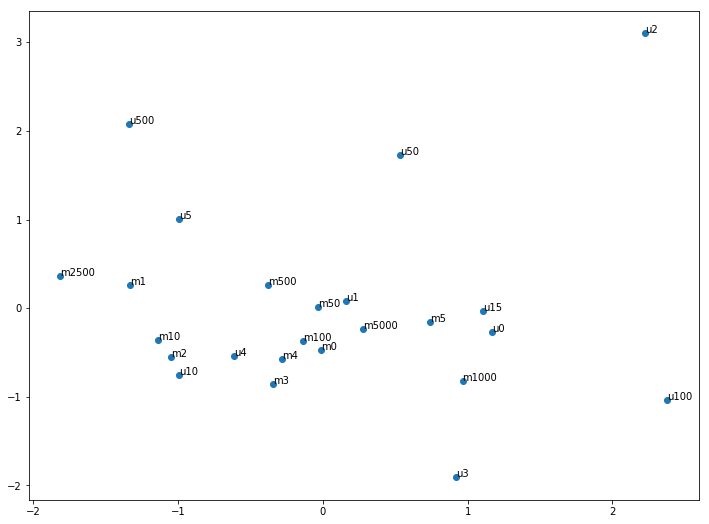

In [611]:
terms = ['u0', 'u1', 'u2', 'u3', 'u4', 'u5', 'u10', 'u15', 'u50', 'u100', 'u500',
'm0', 'm1', 'm2', 'm3', 'm4', 'm5', 'm10', 'm50', 'm100', 'm500', 'm1000', 'm2500', 'm5000']

plot_nodes(terms)


### add genres info as features

In [614]:
genres = ["Action", "Adventure", "Animation", "Children", "Comedy", "Crime", "Documentary", "Drama", "Fantasy", "Film-Noir", "Horror", "Musical", "Mystery", "Romance", "Sci-Fi", "Thriller", "War", "Western", "IMAX"]
for i in genres: df_all[i] = None


for i in range(len(df_all)):
    genres = df_all.loc[i, 'genres'].split('|')
    for category in genres:
        df_all.loc[i, category] = 1

df_all = df_all.fillna(0)

In [615]:
df_all.head(2).append(df_all.tail(1))

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,movie_node_degree,user_node_degree,...,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,IMAX,(no genres listed)
0,1,1,4.0,964982703,m0,u0,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,215,232,...,0,0,0,0,0,0,0,0,0,0.0
1,5,1,4.0,847434962,m0,u4,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,215,44,...,0,0,0,0,0,0,0,0,0,0.0
100835,578,75446,2.5,1300995271,m8897,u577,Little Ashes (2008),Drama,1,27,...,0,0,0,0,0,0,0,0,0,0.0


In [618]:
df_all = df_all.drop(columns=['timestamp', 'title', 'genres', '(no genres listed)'], inplace=False) 


### add user / movie embedding vector as features

In [620]:
# add movie embedding vector as feature
movie_emb = []

for movieId_new in df_all['movieId_new'].unique():
    movie_emb.append([movieId_new, model[movieId_new]])

df_movie_emb = pd.DataFrame(movie_emb, columns=['movieId_new', 'movieId_emb'])

df_all = pd.merge(left=df_all, right=df_movie_emb, on='movieId_new')

In [622]:
# add user embedding vector as feature
user_emb = []

for userId_new in df_all['userId_new'].unique():
    user_emb.append([userId_new, model[userId_new]])

df_user_emb = pd.DataFrame(user_emb, columns=['userId_new', 'user_emb'])

df_all = pd.merge(left=df_all, right=df_user_emb, on='userId_new')

In [623]:
df_all.head(2).append(df_all.tail(1))

,userId,movieId,rating,movieId_new,userId_new,movie_node_degree,user_node_degree,community_movie,community_user,Action,...,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,IMAX,movieId_emb,user_emb
0,1,1,4.0,m0,u0,215,232,0,1,0,...,0,0,0,0,0,0,0,0,"[0.18662739, -0.05288141, -0.32543933, -0.2144...","[0.46873033, 0.2679578, -0.30602527, 0.1142324..."
1,1,3,4.0,m1,u0,52,232,1,1,0,...,0,0,1,0,0,0,0,0,"[0.24788785, 0.29881442, -0.47875315, -0.44797...","[0.46873033, 0.2679578, -0.30602527, 0.1142324..."
100835,578,75446,2.5,m8897,u577,1,27,2,2,0,...,0,0,0,0,0,0,0,0,"[0.3941323, 0.32719526, -0.15548182, -0.157792...","[0.7683669, -0.07862638, -0.3450207, 0.2245586..."


In [12]:
'''
df_features = df_ratings[['userId', 'movieId', 'userId_new', 'movieId_new', 'user_emb', 'movieId_emb', "Action", "Adventure", "Animation", "Children", "Comedy", "Crime", "Documentary", "Drama", "Fantasy", "Film-Noir", "Horror", "Musical", "Mystery", "Romance", "Sci-Fi", "Thriller", "War", "Western", "IMAX", 'rating']]
'''

In [661]:
movie_ft = []

for i in range(len(df_all)): 
    ft = []
    for j in range(9, 28):
        ft.append(df_all.iloc[i, j])

    ft.append(df_all.loc[i, 'movie_node_degree'])
    ft.append(df_all.loc[i, 'community_movie'])
    ft.extend(df_all.loc[i, 'movieId_emb'])
    
    movie_ft.append(ft)
    
df_all['movie_ft'] = movie_ft

In [626]:
df_all.columns

Index(['userId', 'movieId', 'rating', 'movieId_new', 'userId_new',
       'movie_node_degree', 'user_node_degree', 'community_movie',
       'community_user', 'Action', 'Adventure', 'Animation', 'Children',
       'Comedy', 'Crime', 'Documentary', 'Drama', 'Fantasy', 'Film-Noir',
       'Horror', 'Musical', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller', 'War',
       'Western', 'IMAX', 'movieId_emb', 'user_emb'],
      dtype='object')

In [663]:
user_ft = []

for i in range(len(df_all)): 
    ft = []
    ft.append(df_all.loc[i, 'user_node_degree'])
    ft.append(df_all.loc[i, 'community_user'])
    ft.extend(df_all.loc[i, 'user_emb'])
    
    user_ft.append(ft)
    
df_all['user_ft'] = user_ft

In [665]:
print(np.shape(df_all.loc[0, 'movie_ft']))
print(np.shape(df_all.loc[0, 'user_ft']))

(121,)
(102,)


In [682]:
df_all['label'] = None
df_all.loc[df_all['rating']>=3.0, 'label'] = 1 
df_all.loc[df_all['rating']<3.0, 'label'] = 0

In [685]:
df_all['features'] = df_all['movie_ft'] + df_all['user_ft']

## save features / label

In [692]:
# Save
#np.save('./movie_ft.npy', df_all['movie_ft']) 
#np.save('./user_ft.npy', df_all['user_ft']) 
#np.save('./label.npy', df_all['label']) 
#np.save('./all_ft.npy', df_all['features']) 

In [8]:
movie_ft = np.load('./movie_ft.npy', allow_pickle = True) #.item()
user_ft = np.load('./user_ft.npy', allow_pickle = True) #.item()
label = np.load('./label.npy', allow_pickle = True) #.item()

In [9]:
np.shape(user_ft)

(100836,)

In [17]:
df_movie_ft = pd.DataFrame(movie_ft, columns=['movie_ft'])
df_user_ft = pd.DataFrame(user_ft, columns=['user_ft'])
df_label = pd.DataFrame(label, columns=['label'])

df_all = pd.concat([df_movie_ft,df_user_ft,df_label], axis=1)
df_all['feature'] = df_all['movie_ft'] + df_all['user_ft']

In [20]:
df_all

,movie_ft,user_ft,label,feature
0,"[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...","[232, 1, 0.46873033, 0.2679578, -0.30602527, 0...",1,"[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ..."
1,"[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[232, 1, 0.46873033, 0.2679578, -0.30602527, 0...",1,"[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ..."
2,"[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[232, 1, 0.46873033, 0.2679578, -0.30602527, 0...",1,"[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ...","[232, 1, 0.46873033, 0.2679578, -0.30602527, 0...",1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ..."
4,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, ...","[232, 1, 0.46873033, 0.2679578, -0.30602527, 0...",1,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, ..."
...,...,...,...,...
100831,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, ...","[27, 2, 0.7683669, -0.07862638, -0.3450207, 0....",1,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, ..."
100832,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, ...","[27, 2, 0.7683669, -0.07862638, -0.3450207, 0....",1,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, ..."
100833,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ...","[27, 2, 0.7683669, -0.07862638, -0.3450207, 0....",0,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
100834,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, ...","[27, 2, 0.7683669, -0.07862638, -0.3450207, 0....",1,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, ..."


# Step 6. Recommendation system construction.


In [21]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms

from sklearn.model_selection import train_test_split 

## MLP model recommender system

In [22]:
df_all.shape

(100836, 4)

In [26]:
del_set = []

for i in range(len(df_all)):
    if len(df_all.loc[i, 'feature']) != 223:
        del_set.append(i) 

len(del_set)
#df_all = df_all.drop(index=del_set, inplace=False).reset_index(drop=True)

0

In [23]:
feature = []
label = []

for i in range(len(df_all)):
    feature.append(df_all.loc[i, 'feature'])
    label.append(df_all.loc[i, 'label'])

feature = np.array(feature)
label = np.array(label)

In [25]:
print(np.shape(df_all.loc[0, 'feature']))
print(np.shape(feature))
print(np.shape(label))

(223,)
(100836, 223)
(100836,)


In [27]:
X_train, X_test, y_train, y_test = train_test_split(feature, label, test_size=0.1, random_state=42)

X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)


print('train image shape : ', X_train.shape)
print('train label shape : ', y_train.shape)
print('valid image shape : ', X_valid.shape)
print('valid label image : ', y_valid.shape)
print('test image shape  : ', X_test.shape)
print('test image label  : ', y_test.shape)

train image shape :  (72601, 223)
train label shape :  (72601,)
valid image shape :  (18151, 223)
valid label image :  (18151,)
test image shape  :  (10084, 223)
test image label  :  (10084,)


In [35]:
import torch.utils.data as Data
#from torch.utils.data import Dataset, DataLoader

input_size = 223
hidden_size = 64
num_classes = 2
Batch_Size = 100
learning_rate = 0.001
num_epochs = 10

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [29]:
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train).long()
torch_dataset_train = Data.TensorDataset(X_train, y_train)

X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test).long()
torch_dataset_test = Data.TensorDataset(X_test, y_test)

In [30]:
train_loader = Data.DataLoader(dataset=torch_dataset_train,
                        batch_size=Batch_Size,
                        shuffle=True)

test_loader = Data.DataLoader(dataset=torch_dataset_test)

In [32]:
# Fully connected neural network with one hidden layer
class NeuralNet(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(NeuralNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size) 
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)  
    
    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        return out


model = NeuralNet(input_size, hidden_size, num_classes).to(device)

In [36]:
# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  

# Train the model
total_step = len(train_loader)
for epoch in range(num_epochs):
    for i, (batch_x, batch_y) in enumerate(train_loader):
        batch_x = batch_x.to(device)
        batch_y = batch_y.to(device)
        
        # Forward pass
        outputs = model(batch_x)
        loss = criterion(outputs, batch_y)
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 100 == 0:
            print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}' 
                   .format(epoch+1, num_epochs, i+1, total_step, loss.item()))


Epoch [1/10], Step [100/727], Loss: 0.4205
Epoch [1/10], Step [200/727], Loss: 0.3206
Epoch [1/10], Step [300/727], Loss: 0.5038
Epoch [1/10], Step [400/727], Loss: 0.3660
Epoch [1/10], Step [500/727], Loss: 0.4786
Epoch [1/10], Step [600/727], Loss: 0.5928
Epoch [1/10], Step [700/727], Loss: 0.4738
Epoch [2/10], Step [100/727], Loss: 0.4292
Epoch [2/10], Step [200/727], Loss: 0.3970
Epoch [2/10], Step [300/727], Loss: 0.4184
Epoch [2/10], Step [400/727], Loss: 0.3767
Epoch [2/10], Step [500/727], Loss: 0.4086
Epoch [2/10], Step [600/727], Loss: 0.4754
Epoch [2/10], Step [700/727], Loss: 0.3716
Epoch [3/10], Step [100/727], Loss: 0.3471
Epoch [3/10], Step [200/727], Loss: 0.4495
Epoch [3/10], Step [300/727], Loss: 0.3040
Epoch [3/10], Step [400/727], Loss: 0.3563
Epoch [3/10], Step [500/727], Loss: 0.3703
Epoch [3/10], Step [600/727], Loss: 0.3295
Epoch [3/10], Step [700/727], Loss: 0.4608
Epoch [4/10], Step [100/727], Loss: 0.4667
Epoch [4/10], Step [200/727], Loss: 0.4269
Epoch [4/10

In [37]:
# Test the model
with torch.no_grad():
    correct = 0
    total = 0
    for test_x, test_y in test_loader:
        test_x = test_x.to(device)
        test_y = test_y.to(device)
        outputs = model(test_x)
        _, predicted = torch.max(outputs.data, 1)
        total += test_y.size(0)
        correct += (predicted == test_y).sum().item()

    print('Accuracy of the network on the test dataset: {} %'.format(100 * correct / total))


Accuracy of the network on the test dataset: 83.63744545815153 %
